In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns 
import matplotlib.pyplot as plt
import time
import tracemalloc
!pip install pandas_summary
from pandas_summary import DataFrameSummary
%matplotlib inline
sns.set_style("darkgrid")
import plotly.express as px 
import plotly.graph_objects as go
import plotly.figure_factory as ff
!pip install sklearn
from sklearn.model_selection import train_test_split
!pip3 install catboost
from catboost import CatBoostClassifier
from multiprocessing import Pool
from catboost import Pool, cv, CatBoostClassifier, CatBoostRegressor

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

ERROR: Could not find a version that satisfies the requirement sklearn
ERROR: No matching distribution found for sklearn
/kaggle/input/wids-dataset/SampleSubmissionWiDS2021.csv
/kaggle/input/wids-dataset/DataDictionaryWiDS2021.csv
/kaggle/input/wids-dataset/UnlabeledWiDS2021.csv
/kaggle/input/wids-dataset/TrainingWiDS2021.csv


In [2]:
train_df = pd.read_csv ( "../input/wids-dataset/TrainingWiDS2021.csv")
test_df = pd.read_csv("../input/wids-dataset/UnlabeledWiDS2021.csv")
data_dict = pd.read_csv ( "../input/wids-dataset/DataDictionaryWiDS2021.csv")

In [3]:
print ("Train set: ",train_df.shape)
print ("Test set: ",test_df.shape)

Train set:  (130157, 181)
Test set:  (10234, 180)


In [4]:
df_sum = DataFrameSummary(train_df)
df_sum.summary()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,...,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
count,130157.000000,130157.000000,130157.000000,125169.000000,125667.000000,130157.000000,NaN,NaN,128080.000000,NaN,...,16760.000000,16760.000000,130157.00000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000
mean,65079.000000,213000.856519,106.102131,61.995103,29.110260,0.189840,NaN,NaN,169.607219,NaN,...,247.525419,239.617358,0.00103,0.016081,0.013599,0.025669,0.007307,0.004187,0.020852,0.216285
std,37573.233831,38109.828146,63.482277,16.822880,8.262776,0.392176,NaN,NaN,10.833085,NaN,...,131.440167,128.562211,0.03207,0.125786,0.115819,0.158146,0.085166,0.064574,0.142888,0.411712
min,1.000000,147000.000000,1.000000,0.000000,14.844926,0.000000,NaN,NaN,137.200000,NaN,...,42.000000,38.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32540.000000,180001.000000,49.000000,52.000000,23.598006,0.000000,NaN,NaN,162.500000,NaN,...,144.000000,138.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65079.000000,213014.000000,112.000000,64.000000,27.564749,0.000000,NaN,NaN,170.100000,NaN,...,228.125000,218.750000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,97618.000000,246002.000000,165.000000,75.000000,32.803127,0.000000,NaN,NaN,177.800000,NaN,...,333.000000,324.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,130157.000000,279000.000000,204.000000,89.000000,67.814990,1.000000,NaN,NaN,195.590000,NaN,...,720.000000,654.813793,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
counts,130157,130157,130157,125169,125667,130157,128570,130091,128080,96959,...,16760,16760,130157,130157,130157,130157,130157,130157,130157,130157
uniques,130157,130157,204,75,41453,2,6,2,443,15,...,3425,3404,2,2,2,2,2,2,2,2


In [5]:
data_dict.head(8)

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient un...,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,demographic,age,Years,numeric,The age of the patient on unit admission,None
3,demographic,bmi,kilograms/metres^2,string,The body mass index of the person on unit admi...,21.5
4,demographic,elective_surgery,None,binary,Whether the patient was admitted to the hospit...,0
5,demographic,ethnicity,None,string,The common national or cultural tradition whic...,Caucasian
6,demographic,gender,None,string,The genotypical sex of the patient,F
7,demographic,height,centimetres,numeric,The height of the person on unit admission,180


In [6]:
train_df.drop(columns="Unnamed: 0", axis = 1 , inplace = True)

In [7]:
test_df.drop(columns="Unnamed: 0", axis = 1 , inplace = True)

In [8]:
train_df.info(null_counts = True, verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130157 entries, 0 to 130156
Data columns (total 180 columns):
 #    Column                       Non-Null Count   Dtype  
---   ------                       --------------   -----  
 0    encounter_id                 130157 non-null  int64  
 1    hospital_id                  130157 non-null  int64  
 2    age                          125169 non-null  float64
 3    bmi                          125667 non-null  float64
 4    elective_surgery             130157 non-null  int64  
 5    ethnicity                    128570 non-null  object 
 6    gender                       130091 non-null  object 
 7    height                       128080 non-null  float64
 8    hospital_admit_source        96959 non-null   object 
 9    icu_admit_source             129917 non-null  object 
 10   icu_id                       130157 non-null  int64  
 11   icu_stay_type                130157 non-null  object 
 12   icu_type                     130157 non-nu

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


In [9]:
#Checking for Null 
train_df.isnull().sum().sort_values(ascending=False)

h1_bilirubin_max     119861
h1_bilirubin_min     119861
h1_albumin_max       119005
h1_albumin_min       119005
h1_lactate_max       118467
                      ...  
icu_type                  0
icu_stay_type             0
icu_id                    0
elective_surgery          0
diabetes_mellitus         0
Length: 180, dtype: int64

In [10]:
#Replacing Null values from numerical data with its Mean
for col in train_df.columns:
    if train_df[col].dtype=='int' or train_df[col].dtype=='float':
        train_df[col]=train_df[col].fillna(train_df[col].mean())
for col in test_df.columns:
    if test_df[col].dtype=='int' or test_df[col].dtype=='float':
        test_df[col]=test_df[col].fillna(test_df[col].mean())

In [11]:
#ReplacingNull Values from categorical features with the max number
cat_cols=[col for col in train_df.columns if
         train_df[col].dtype=="object"]

for col in cat_cols:
    print(train_df[col].value_counts())

max_val=['Caucasian','M','Emergency Department','Accident & Emergency','admit','Med-Surg ICU']
for i,col in enumerate(cat_cols):
    if train_df[col].isnull().any()==True:
        train_df[col]=train_df[col].fillna(max_val[i])

for i,col in enumerate(cat_cols):
    if test_df[col].isnull().any()==True:
        test_df[col]=test_df[col].fillna(max_val[i])

Caucasian           100236
African American     13911
Other/Unknown         6261
Hispanic              5049
Asian                 2198
Native American        915
Name: ethnicity, dtype: int64
M    70518
F    59573
Name: gender, dtype: int64
Emergency Department    51258
Operating Room          13757
Floor                   11324
Direct Admit             8253
Recovery Room            4563
Other Hospital           2417
Acute Care/Floor         2097
Step-Down Unit (SDU)     1607
PACU                     1031
Other ICU                 283
Chest Pain Center         253
ICU to SDU                 62
ICU                        37
Observation                10
Other                       7
Name: hospital_admit_source, dtype: int64
Accident & Emergency         76846
Operating Room / Recovery    27436
Floor                        21459
Other Hospital                3464
Other ICU                      712
Name: icu_admit_source, dtype: int64
admit       124741
transfer      4801
readmit        61

In [12]:
train_df.dtypes

encounter_id                     int64
hospital_id                      int64
age                            float64
bmi                            float64
elective_surgery                 int64
                                ...   
immunosuppression                int64
leukemia                         int64
lymphoma                         int64
solid_tumor_with_metastasis      int64
diabetes_mellitus                int64
Length: 180, dtype: object

In [13]:
categorical_features=[]
for c in train_df.columns:
    col_type = train_df[c].dtype
    if col_type == 'object' or col_type.name == 'category':
        train_df[c] = train_df[c].astype('category')
        categorical_features.append(c)
print (categorical_features)

['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type']


In [14]:
numerical_features = [feature for feature in train_df.columns if train_df[feature].dtypes != 'O']
print (numerical_features)

['encounter_id', 'hospital_id', 'age', 'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'icu_type', 'pre_icu_los_days', 'readmission_status', 'weight', 'albumin_apache', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_post_operative', 'arf_apache', 'bilirubin_apache', 'bun_apache', 'creatinine_apache', 'fio2_apache', 'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_unable_apache', 'gcs_verbal_apache', 'glucose_apache', 'heart_rate_apache', 'hematocrit_apache', 'intubated_apache', 'map_apache', 'paco2_apache', 'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'resprate_apache', 'sodium_apache', 'temp_apache', 'urineoutput_apache', 'ventilated_apache', 'wbc_apache', 'd1_diasbp_invasive_max', 'd1_diasbp_invasive_min', 'd1_diasbp_max', 'd1_diasbp_min', 'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min', 'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_mbp_max',

In [15]:
diabetes_df = pd.DataFrame(train_df['diabetes_mellitus'].value_counts()).rename(index={0: "Not diabetic", 1: "Diabetic"})
diabetes_df['Percentage of Diabetic patient'] = round(100*diabetes_df["diabetes_mellitus"]/len(train_df),2)
fig = go.Figure(data = [go.Bar(
                            x = diabetes_df.index.tolist(), 
                            y = diabetes_df["Percentage of Diabetic patient"].tolist(), 
                            width = [0.4,0.4],
                            marker_color = ['grey', 'green']
                            )])

fig.update_layout(yaxis_range=[0,100], 
                  title_text='Percentage of Diabetic patient chart', xaxis_title = "Feature", yaxis_title = "Percentage of diabetic patient")

(array([ 1132.,  5828.,  7458., 11937., 23212., 33715., 27363., 19482.,
            0.,     0.]),
 array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110]),
 <BarContainer object of 10 artists>)

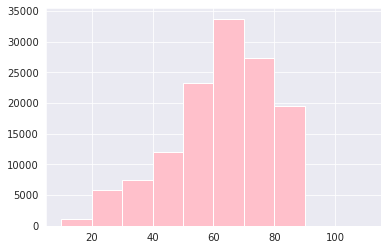

In [16]:
# Checking age distribution on the training set
plt.hist(train_df.age, bins=[10,20,30,40,50,60,70,80,90,100,110],color='pink')


(array([31887., 41644., 23392., 11537.,  5581.,  2600.,  1311.,   710.,
          403.,   792.]),
 array([20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70]),
 <BarContainer object of 10 artists>)

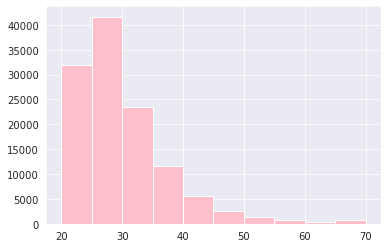

In [17]:
# Checking BMI distribution on the training set
plt.hist(train_df.bmi, bins=[20,25,30,35,40,45,50,55,60,65,70],color='pink')

(array([    0.,   755.,   725.,  2354.,  8983.,  9635., 40789., 20667.,
        19213., 16398.,  7284.,  2642.,   712.,     0.]),
 array([130, 135, 140, 145, 150, 155, 160, 170, 175, 180, 185, 190, 195,
        200, 205]),
 <BarContainer object of 14 artists>)

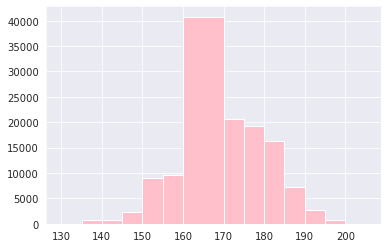

In [18]:
# Checking height distribution on the training set
plt.hist(train_df.height, bins=[130,135,140,145,150,155,160,170,175,180,185,190,195,200,205],color='pink')

In [19]:
train_df.ethnicity.value_counts()

Caucasian           101823
African American     13911
Other/Unknown         6261
Hispanic              5049
Asian                 2198
Native American        915
Name: ethnicity, dtype: int64

In [20]:
train_df.gender.value_counts()

M    70584
F    59573
Name: gender, dtype: int64

In [21]:
train_df.hospital_admit_source.value_counts()

Emergency Department    84456
Operating Room          13757
Floor                   11324
Direct Admit             8253
Recovery Room            4563
Other Hospital           2417
Acute Care/Floor         2097
Step-Down Unit (SDU)     1607
PACU                     1031
Other ICU                 283
Chest Pain Center         253
ICU to SDU                 62
ICU                        37
Observation                10
Other                       7
Name: hospital_admit_source, dtype: int64

In [22]:
train_df.icu_admit_source.value_counts()

Accident & Emergency         77086
Operating Room / Recovery    27436
Floor                        21459
Other Hospital                3464
Other ICU                      712
Name: icu_admit_source, dtype: int64

(array([108431.,   7143.,   4058.,   2758.,   1894.,   1313.,   1011.,
           693.,    508.,    338.,    949.,    297.,    199.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 15, 20, 30]),
 <BarContainer object of 13 artists>)

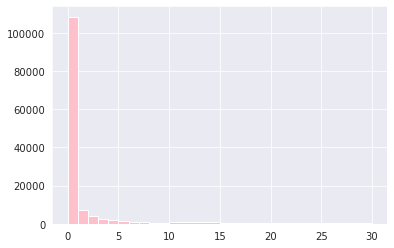

In [23]:
plt.hist(train_df.pre_icu_los_days, bins=[0,1,2,3,4,5,6,7,8,9,10,15,20,30],color='pink')

(array([  870.,  5191., 12961., 20044., 23630., 24259., 16087., 10384.,
         6559.,  3932.,  2226.,  1364.,   891.,   530.,   386.,   843.,
            0.]),
 array([  0,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130, 140, 150,
        160, 170, 180, 190, 200]),
 <BarContainer object of 17 artists>)

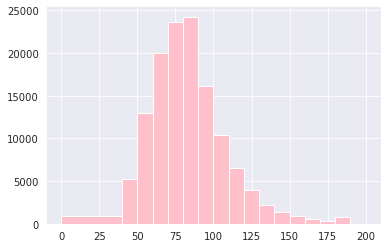

In [24]:
plt.hist(train_df.weight, bins=[0,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200],color='pink')

In [25]:
train_df.diabetes_mellitus.value_counts()

0    102006
1     28151
Name: diabetes_mellitus, dtype: int64

In [26]:
# visualize gender vs target feature
fig = px.histogram(train_df, x='gender', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='gender vs diabetes')
fig.show()

# visualize ethnicity vs target feature
fig = px.histogram(train_df, x='ethnicity', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='ethnicity vs diabetes')
fig.show()

# visualize hospital_admit_source vs target feature
fig = px.histogram(train_df, x='hospital_admit_source', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='hospital_admit_source vs diabetes')
fig.show()

# visualize icu_admit_source vs target feature
fig = px.histogram(train_df, x='icu_admit_source', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='icu_admit_source vs diabetes')
fig.show()

# visualize icu_stay_type vs target feature
fig = px.histogram(train_df, x='icu_stay_type', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='icu_stay_type vs diabetes')
fig.show()


# visualize icu_type vs target feature
fig = px.histogram(train_df, x='icu_type', y='diabetes_mellitus', width = 500, height = 400)
fig.update_layout(title='icu_type vs diabetes')
fig.show()


In [27]:
y=train_df.diabetes_mellitus
X=train_df.drop(['hospital_id','diabetes_mellitus'],axis=1)
X_train,X_vals,y_train,y_vals=train_test_split(X,y,test_size=0.3,random_state=0,stratify=y)
X_test=test_df.drop(['hospital_id'],axis=1)


In [28]:

train_pool = Pool(data=X_train,label = y_train,cat_features=cat_cols,
 )

In [29]:


cat=CatBoostClassifier(
    iterations=2000,
    max_depth=7,
    random_strength=3.5,
    od_type='IncToDec',
    custom_metric=['AUC'],
    verbose=False
)
cat.fit(train_pool,
        eval_set=(X_vals,y_vals),
        use_best_model=True,
        early_stopping_rounds=200,
        plot=True)
print(cat.get_best_score())
X_test['diabetes_mellitus']=cat.predict_proba(X_test)[:,1]


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

{'learn': {'Logloss': 0.23008402852627133}, 'validation': {'Logloss': 0.35690815640034607, 'AUC': 0.8673822034613641}}


In [30]:
cat_pred = cat.predict_proba(X_test)[:,1]

In [31]:
# Submission dataframe
submit = test_df[['encounter_id']]
submit['diabetes_mellitus'] = cat_pred
submit.to_csv('catboost.csv',index=False)
submit.head()

,encounter_id,diabetes_mellitus
0,144740,0.040099
1,141990,0.126713
2,142038,0.128883
3,138628,0.080233
4,141682,0.390014
